# Deep Learning :  Face Recognition via NMF and Deep-NMF Implementations!
---
---
### By - Anisha Katiyar

## Importing Necessary Libraries
---


In [57]:
import numpy as np
import pandas as pd
import sklearn as skl
import matplotlib.pyplot as plt
from sklearn.datasets import _olivetti_faces

from sklearn.decomposition import NMF

import torch
import torch.nn as nn
from tqdm import tqdm
from sklearn.model_selection import train_test_split


from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA

%matplotlib inline

## Getting, Understanding and Assessing the Dataset
---

In [58]:
dts = _olivetti_faces.fetch_olivetti_faces()
#dts

In [59]:
dts.keys()

dict_keys(['data', 'images', 'target', 'DESCR'])

In [60]:
print("Data List Length - " + str(len(dts['data'])))
print("Length of Each Element - " + str(len(dts['data'][0])))

print("\nImages List Length - " + str(len(dts['images'])))
print("Length of Each Element - " + str(len(dts['images'][0])))

print("\nTarget List Length - " + str(len(dts['target'])))
print("Length of Each Element - " + str(1))

Data List Length - 400
Length of Each Element - 4096

Images List Length - 400
Length of Each Element - 64

Target List Length - 400
Length of Each Element - 1


In [61]:
len(dts['data'][0])

4096

In [62]:
dts['images']

array([[[0.30991736, 0.3677686 , 0.41735536, ..., 0.37190083,
         0.3305785 , 0.30578512],
        [0.3429752 , 0.40495867, 0.43801653, ..., 0.37190083,
         0.338843  , 0.3140496 ],
        [0.3429752 , 0.41735536, 0.45041323, ..., 0.38016528,
         0.338843  , 0.29752067],
        ...,
        [0.21487603, 0.20661157, 0.2231405 , ..., 0.15289256,
         0.16528925, 0.17355372],
        [0.20247933, 0.2107438 , 0.2107438 , ..., 0.14876033,
         0.16115703, 0.16528925],
        [0.20247933, 0.20661157, 0.20247933, ..., 0.15289256,
         0.16115703, 0.1570248 ]],

       [[0.45454547, 0.47107437, 0.5123967 , ..., 0.19008264,
         0.18595041, 0.18595041],
        [0.446281  , 0.48347107, 0.5206612 , ..., 0.21487603,
         0.2107438 , 0.2107438 ],
        [0.49586776, 0.5165289 , 0.53305787, ..., 0.20247933,
         0.20661157, 0.20661157],
        ...,
        [0.77272725, 0.78099173, 0.7933884 , ..., 0.1446281 ,
         0.1446281 , 0.1446281 ],
        [0.7

In [63]:
dts['target']

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  6,  6,  6,
        6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9, 10, 10,
       10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11,
       11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13,
       13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15,
       15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16,
       17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18, 18,
       18, 18, 18, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 20, 20, 20, 20,
       20, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22,
       22, 22, 22, 22, 22

In [64]:
X, y = _olivetti_faces.fetch_olivetti_faces(return_X_y=True)
X = X.T

print(f"The shape of X is: {X.shape}")
print(f"The shape of y is: {y.shape}")

print(f"\nThe total number of labels are: {len(list(set(y)))}")
print(f"The labels are: {list(set(y))}")

The shape of X is: (4096, 400)
The shape of y is: (400,)

The total number of labels are: 40
The labels are: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]


In [65]:
# Checking the Range of Values to see if Data needs a better Normalization
print("Min Val - " + str(min(X[0])))
print("Max Val - " + str(max(X[0])))

Min Val - 0.08677686
Max Val - 0.8057851


Hence, the data is already normalized.

## Displaying the Faces, one from each label!
---

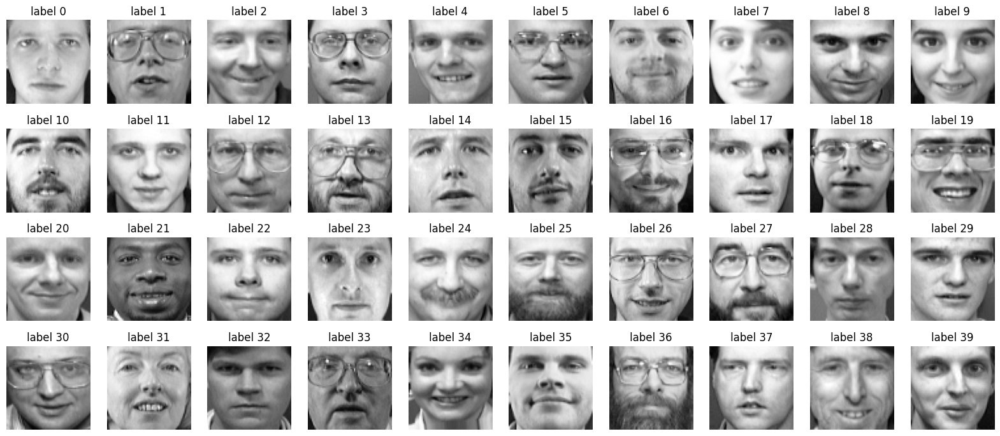

In [66]:
# Gray Scaled Visualization of Features Matrix
plt.figure(figsize=(20,8.5))
for i in range(40):
    plt.subplot(4, 10, i+1)
    plt.imshow(X.T[i*10].reshape(64, 64))
    plt.title(f"label {y[i*10]}")
    plt.set_cmap('gray')
    plt.axis('off')

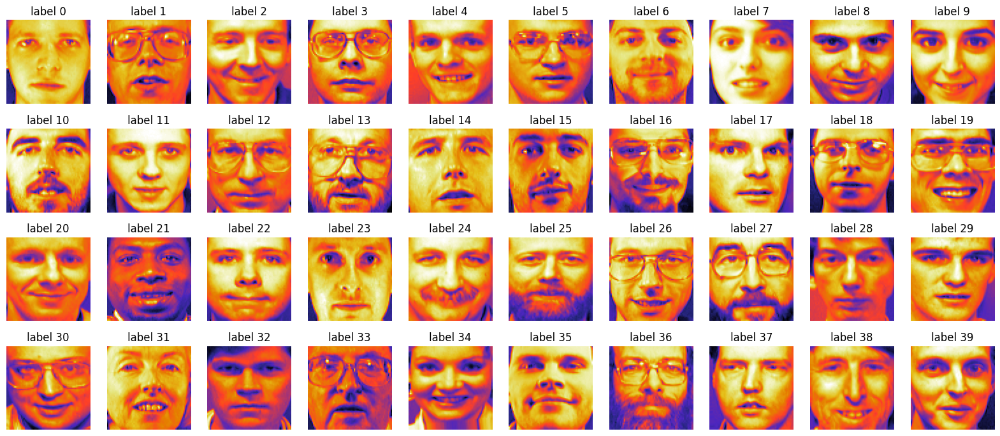

In [67]:
# High Contrast Visualization of Features Matrix
plt.figure(figsize=(20,8.5))
for i in range(40):
    plt.subplot(4, 10, i+1)
    plt.imshow(X.T[i*10].reshape(64, 64))
    plt.title(f"label {y[i*10]}")
    plt.set_cmap('CMRmap')
    plt.axis('off')

## Major Idea behind NMF
---

NMF computes the W and H matrices such that W represents the basis (reduced representation) and H contains the coefficients/weights in which these should be combined to obtain a representation as close to the original image as possible.

![image](https://user-images.githubusercontent.com/42088801/129451068-86f48d97-8637-4b8f-b034-a868cbb2e146.png)

# Part-1
---
## Iterative Implementation of Non-negative Matrix Factorization!
---
---

### a) Direct Use of NMF Class

In [68]:
# Applying NMF Model
model = NMF(n_components=144, init='random', random_state=0, max_iter=2500)

W1 = model.fit_transform(X)
H1 = model.components_

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 2500 reached. Increase it to improve convergence.
  warnings.warn(


Another option for the init parameter is 'nndsvd', which uses a deterministic initialization method based on singular value decomposition (SVD). It can 'sometimes' lead to faster convergence and better results than pure random initialization.

In [69]:
print(X.shape)
print(W1.shape)
print(H1.shape)

# print(W1[0])
# print(H1[0])

(4096, 400)
(4096, 144)
(144, 400)


### b) Creating Custom NMF Class

In [70]:
# Frobenius Norm Function
def Frobenius_Norm(A, W, H):
    return np.linalg.norm(A - np.matmul(W, H), 'fro')

In [71]:
# To Retain all the Losses in the Training Steps
losses = []

In [72]:
# Custom NMF Function
def MyNMF(A, k, max_iter=1000, tol=1e-7):
    m, n = A.shape
    # W should be non-negative
    W = np.random.rand(m, k)
    H = np.random.rand(k, n)
    for i in range(max_iter):
        W = W * np.matmul(A, H.T) / np.matmul(np.matmul(W, H), H.T)
        H = H * np.matmul(W.T, A) / np.matmul(np.matmul(W.T, W), H)
        losses.append(Frobenius_Norm(A, W, H))
        if i%250 == 0:
            print('Iter : ', i, '   Loss : ', Frobenius_Norm(A, W, H))
        if Frobenius_Norm(A, W, H) < tol:
            break
    return W, H

In [73]:
# Apply via Custom NMF Function
W2, H2 = MyNMF(X, 144, max_iter=2500, tol=1e-7)

Iter :  0    Loss :  158.1860400476422
Iter :  250    Loss :  63.530055551088765
Iter :  500    Loss :  53.72434090044798
Iter :  750    Loss :  50.33946688635729
Iter :  1000    Loss :  48.66404825314683
Iter :  1250    Loss :  47.67024059936449
Iter :  1500    Loss :  47.006457167600246
Iter :  1750    Loss :  46.52826328578065
Iter :  2000    Loss :  46.16377348077726
Iter :  2250    Loss :  45.87450840485274


In [74]:
print(X.shape)
print(W2.shape)
print(H2.shape)

# print(W2[0])
# print(H2[0])

(4096, 400)
(4096, 144)
(144, 400)


### Visualizing Matrices W and H, and also Reconstruction from them!

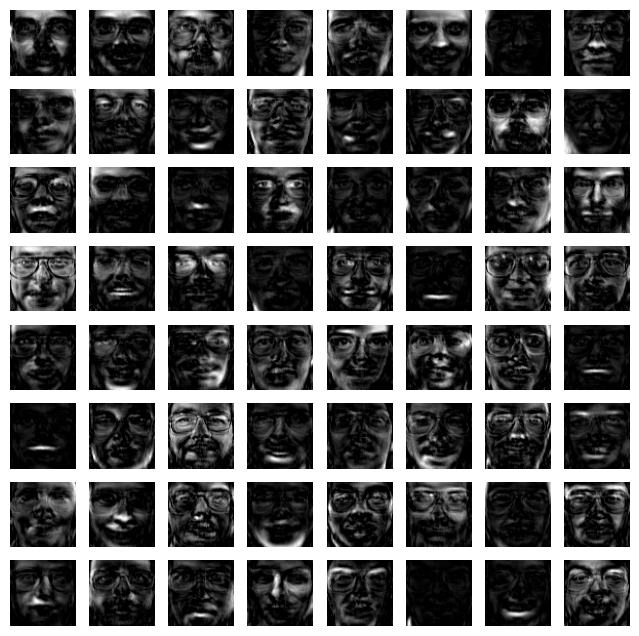

In [75]:
# Displaying Basis Matrix - W1
fig, ax = plt.subplots(8, 8, figsize=(8, 8))
for i, axi in enumerate(ax.flat):
    axi.imshow(W1.T[i].reshape(64, 64), cmap='gray')
    axi.axis('off')

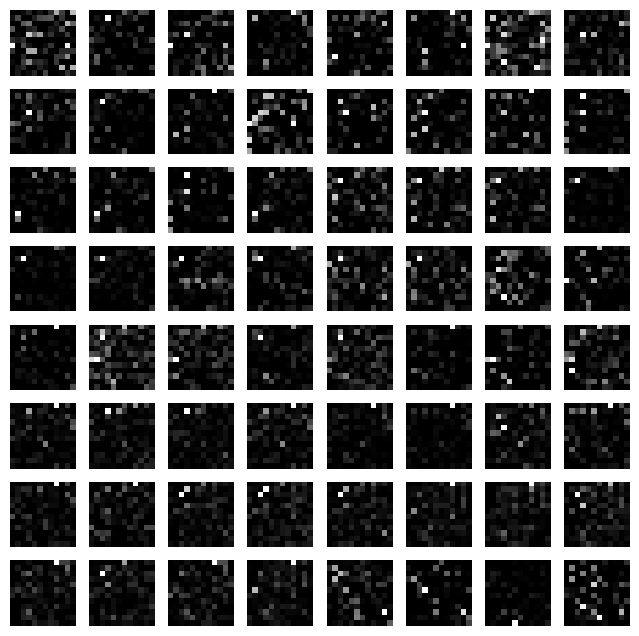

In [76]:
# Displaying Coefficients Matrix - H1
fig, ax = plt.subplots(8, 8, figsize=(8,8))
for i, axi in enumerate(ax.flat):
    axi.imshow(H1.T[i].reshape(12,12), cmap='gray')
    axi.axis('off')

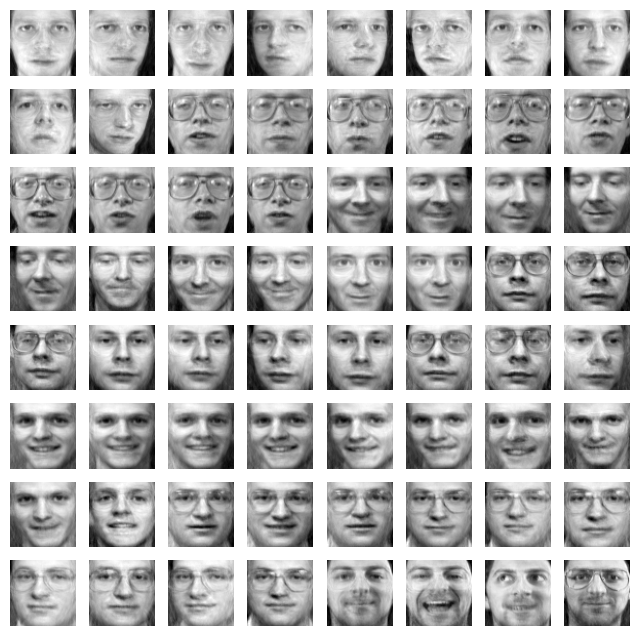

In [77]:
# Displaying Reconstructed Matrix X1 = W1*H1
fig, ax = plt.subplots(8,8, figsize=(8,8))
X1 = W1@H1
for i, axi in enumerate(ax.flat):
    axi.imshow(X1.T[i].reshape(64,64), cmap='gray')
    axi.axis('off')

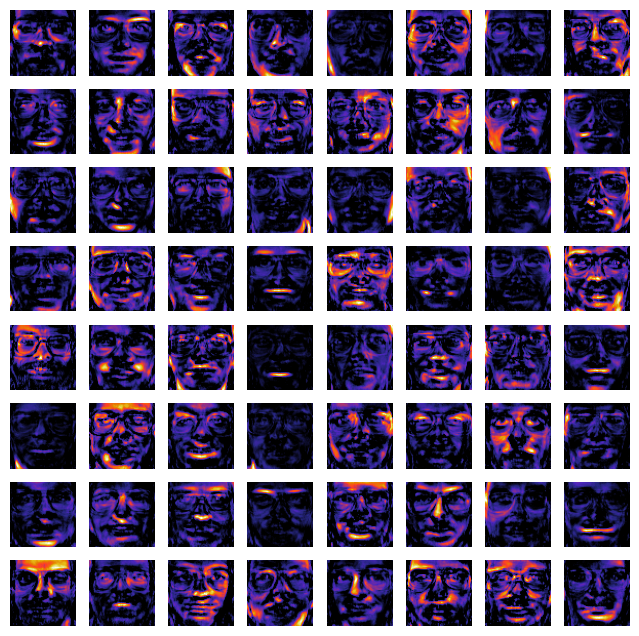

In [78]:
# Displaying Basis Matrix - W2
fig, ax = plt.subplots(8, 8, figsize=(8, 8))
for i, axi in enumerate(ax.flat):
    axi.imshow(W2.T[i].reshape(64, 64), cmap='CMRmap')
    axi.axis('off')

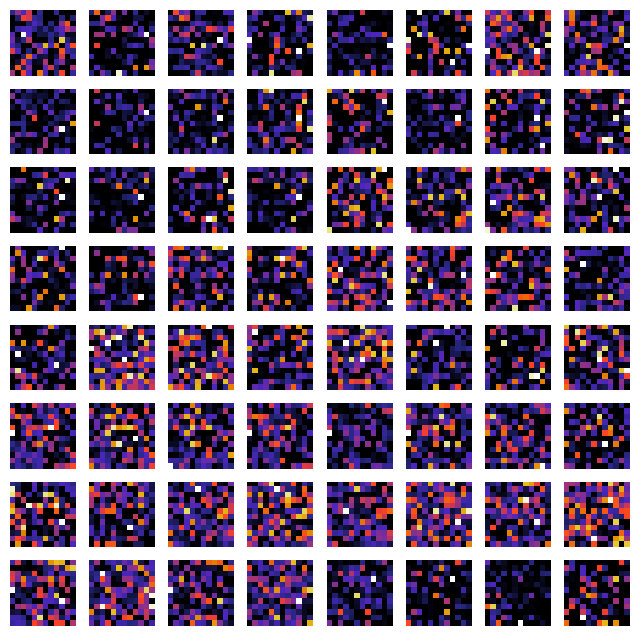

In [79]:
# Displaying Coefficients Matrix - H2
fig, ax = plt.subplots(8, 8, figsize=(8,8))
for i, axi in enumerate(ax.flat):
    axi.imshow(H2.T[i].reshape(12,12), cmap='CMRmap')
    axi.axis('off')

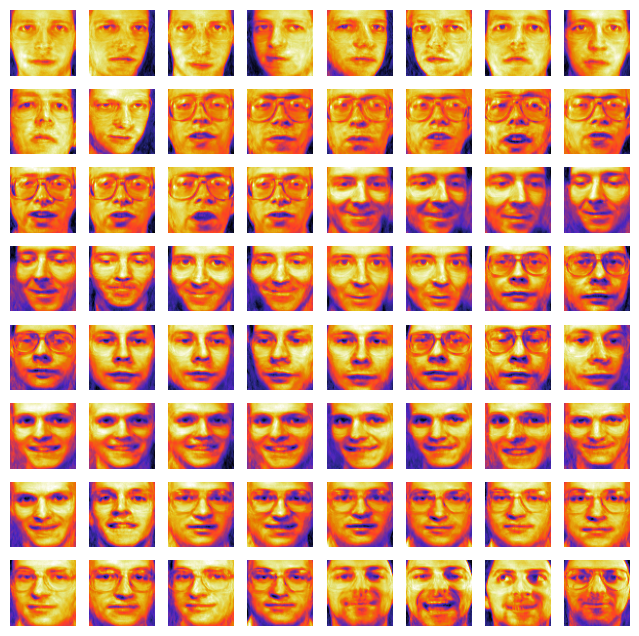

In [80]:
# Displaying Reconstructed Matrix X2 = W2*H2
fig, ax = plt.subplots(8,8, figsize=(8,8))
X2 = W2@H2
for i, axi in enumerate(ax.flat):
    axi.imshow(X2.T[i].reshape(64,64), cmap='CMRmap')
    axi.axis('off')

### Visualizing the Iterative Losses!

In [81]:
#print(losses)
print(" Max Value in Losses -> " + str(max(losses)))
print(" Min Value in Losses -> " + str(min(losses)))

 Max Value in Losses -> 158.1860400476422
 Min Value in Losses -> 45.63951026634159


Text(0, 0.5, ' Loss ')

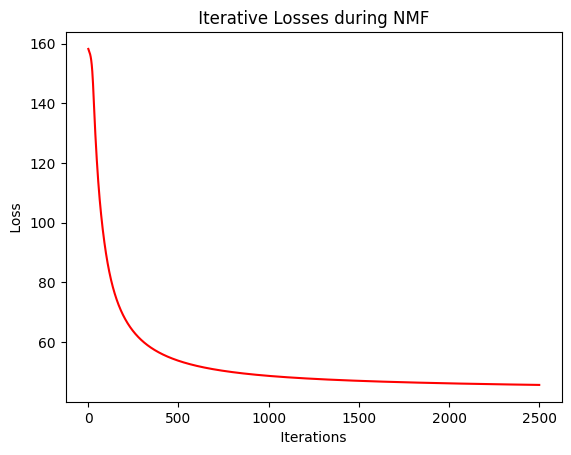

In [82]:
plt.plot(range(1,len(losses)+1), losses, color='r')
plt.title(' Iterative Losses during NMF ')
plt.xlabel(' Iterations ')
plt.ylabel(' Loss ')

## Displaying all of the 40 Faces from Set along with their NMF reconstructions!

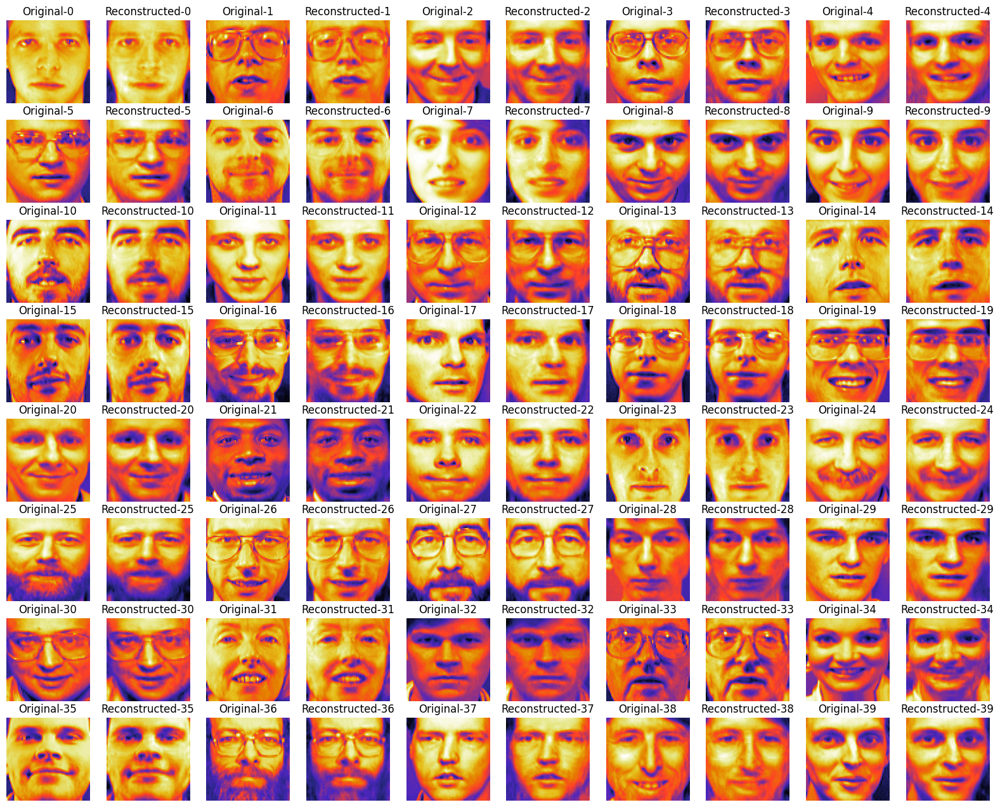

In [83]:
# Final Result!
plt.figure(figsize=(20, 16))

for i in range(40):

    plt.subplot(8, 10, i*2 + 1)
    plt.title(f"Original-{y[i*10]}")
    plt.imshow(X.T[i*10].reshape(64,64))
    plt.set_cmap('CMRmap')
    plt.axis('off')

    plt.subplot(8, 10, i*2 + 2)
    plt.title(f"Reconstructed-{y[i*10]}")
    plt.imshow(X2.T[i*10].reshape(64,64))
    plt.set_cmap('CMRmap')
    plt.axis('off')

Hence, we achieved a decent reconstruction from W and H back to X as per observation.

# Part-2
---
## Implementation of Non-negative Matrix Factorization via Neural Networks!
---
---

In [84]:
# Step-1 : Splitting the Existing Dataset
X_train, X_test, y_train, y_test = train_test_split(dts.data, dts.target, test_size=0.2, random_state=0)

In [85]:
# Step-2.1 : Displaying the Dimensions of X
print(f"Shape -> X_train : {X_train.shape}")
print(f"Shape -> X_test  : {X_test.shape}")

Shape -> X_train : (320, 4096)
Shape -> X_test  : (80, 4096)


In [86]:
# Step-2.2 : Displaying the Dimensions of y
print(f"Shape -> y_train : {y_train.shape}")
print(f"Shape -> y_test  : {y_test.shape}")

Shape -> y_train : (320,)
Shape -> y_test  : (80,)


In [87]:
# Step-3 : Converting all 4 to Torch Tensors
X_train = torch.from_numpy(X_train)
X_test = torch.from_numpy(X_test)
y_train = torch.from_numpy(y_train)
y_test = torch.from_numpy(y_test)

In [88]:
# Step-4 : Normalizing and Reshaping Values of X
X_train = X_train.float() / 255
X_test = X_test.float() / 255

X_train = X_train.view(-1, 1, 64, 64)
X_test = X_test.view(-1, 1, 64, 64)

In [89]:
# Step-5 : Displaying the New Dimensions of X
print(f"Shape -> X_train : {X_train.shape}")
print(f"Shape -> X_test  : {X_test.shape}")

Shape -> X_train : torch.Size([320, 1, 64, 64])
Shape -> X_test  : torch.Size([80, 1, 64, 64])


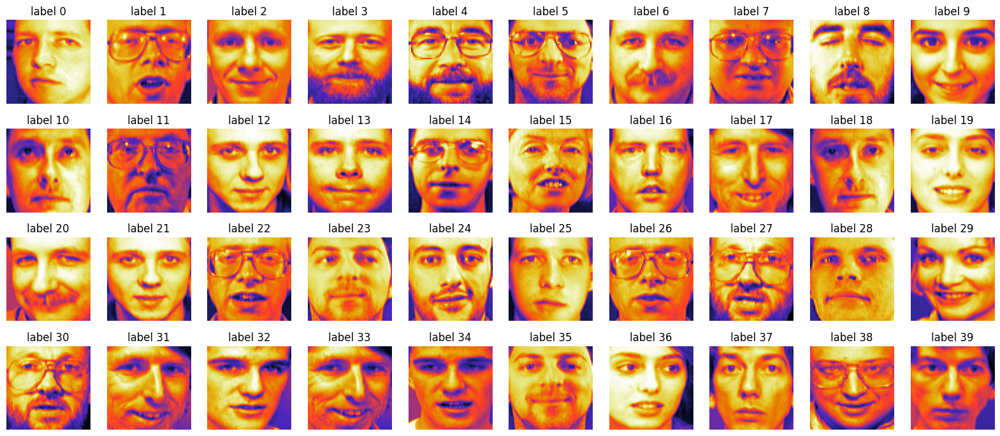

In [90]:
# Step-6 : High Contrast Visualization of Features Matrix from X_Train
plt.figure(figsize=(20,8.5))
for i in range(40):
    plt.subplot(4, 10, i+1)
    plt.imshow(X_train[i][0])
    plt.title(f"label {y[i*10]}")
    plt.set_cmap('CMRmap')
    plt.axis('off')

In [91]:
# Step-7 : Defining the Custom Deep-NMF Class (For Single Layer Neural Network)
class MyDeepNMF(nn.Module):
    def __init__(self, n_components=64):
        super().__init__()
        self.relu = nn.ReLU()
        self.l1 = nn.Linear(4096, n_components)
        self.W = None
        self.H = None

    def forward(self, X):
        X = X.view(-1, 4096)
        self.H = self.relu(self.l1(X))
        self.W = self.l1.weight.clamp(min=0)

        return self.W, self.H

In [92]:
# Step-8 : Defining Frobenius-Norm for the same
def Frobenius_Norm(target, op):
    return torch.sqrt(torch.sum(torch.square(target - op)))

In [93]:
# Step-9 : Setting Parameters
model = MyDeepNMF(144)
criterion = Frobenius_Norm
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [94]:
# Step-10 : Setting Appropriate Epoch Value
# epochs = 500 -> too less
epochs = 2500
# epochs = 5000 -> too much

In [95]:
# Step-11 : Training the Deep-NMF Model using Gradient Descent
losses = []
for epoch in tqdm(range(epochs)):
    optimizer.zero_grad()
    W, H = model(X_train)
    loss = criterion(X_train, torch.matmul(H,W).reshape(-1, 1, 64, 64))
    losses.append(loss.item())
    loss.backward()
    optimizer.step()

100%|██████████| 2500/2500 [02:22<00:00, 17.50it/s]


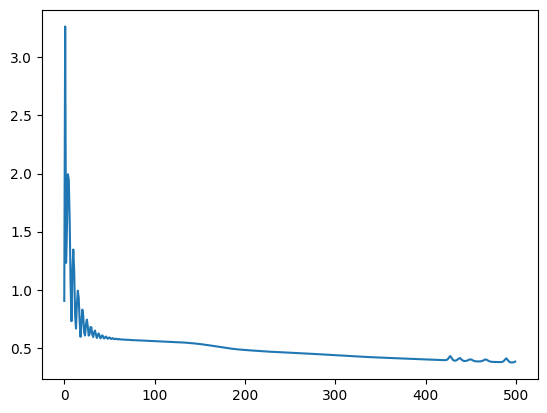

In [260]:
# Step-12.1 : Displaying the Frobenius Norm vs Iterations for 500 Epochs
plt.plot(losses);

Clearly, the model needs to be trained with higher number of Epochs!

Text(0, 0.5, ' Loss ')

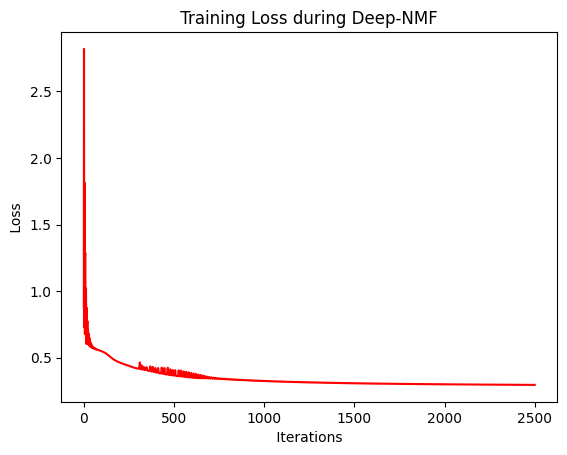

In [96]:
# Step-12.2 : Displaying the Frobenius Norm vs Iterations for 2500 Epochs
plt.plot(losses, color='r');
plt.title(' Training Loss during Deep-NMF ')
plt.xlabel(' Iterations ')
plt.ylabel(' Loss ')

Hence, we now know that 2500 is a sufficient value for Epochs for Training!

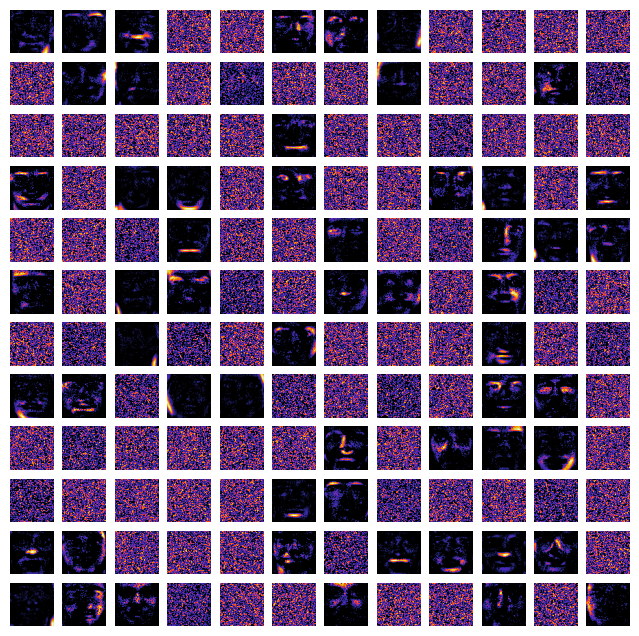

In [97]:
# Step-13 : Plotting the Basis Matrix 'W'
fig, ax = plt.subplots(12, 12, figsize=(8,8))
for i, axi in enumerate(ax.flat):
    axi.imshow(model.W.detach().numpy()[i].reshape(64, 64), cmap='CMRmap')
    axi.axis('off')

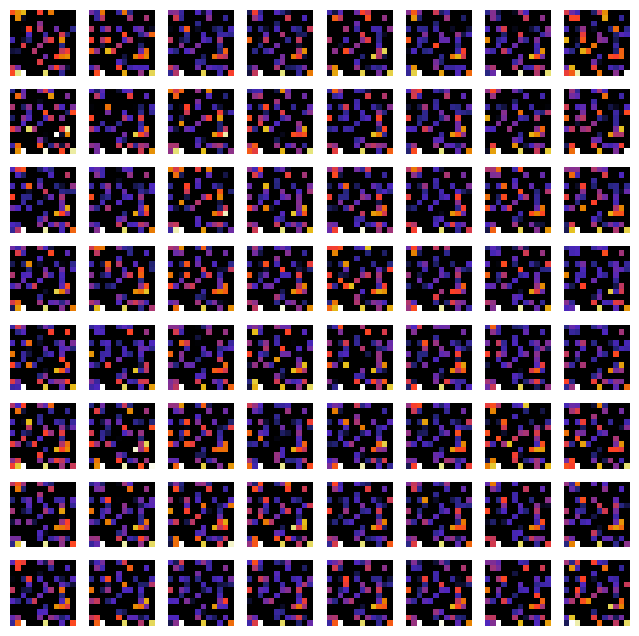

In [98]:
# Step-14 : Plotting the Coefficients Matrix 'H'
fig, ax = plt.subplots(8, 8, figsize=(8,8))
for i, axi in enumerate(ax.flat):
    axi.imshow(model.H.detach().numpy()[i].reshape(12, 12), cmap='CMRmap')
    axi.axis('off')

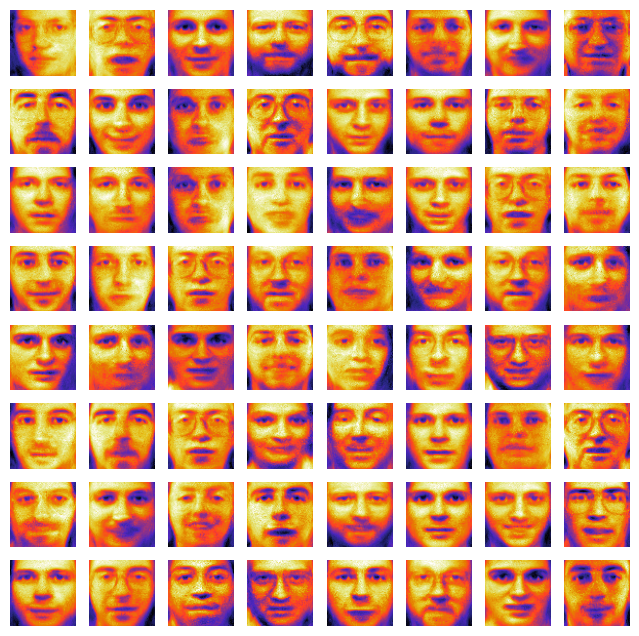

In [99]:
# Step-15 : Reconstructing the Matrix X from W and H!
Xx = torch.matmul(model.H, model.W).reshape(-1, 1, 64, 64)

fig, ax = plt.subplots(8, 8, figsize=(8,8))
for i, axi in enumerate(ax.flat):
    axi.imshow(Xx.detach().numpy()[i].reshape(64, 64), cmap='CMRmap')
    axi.axis('off')

### Now we try to Test on the Unused/Untested Images

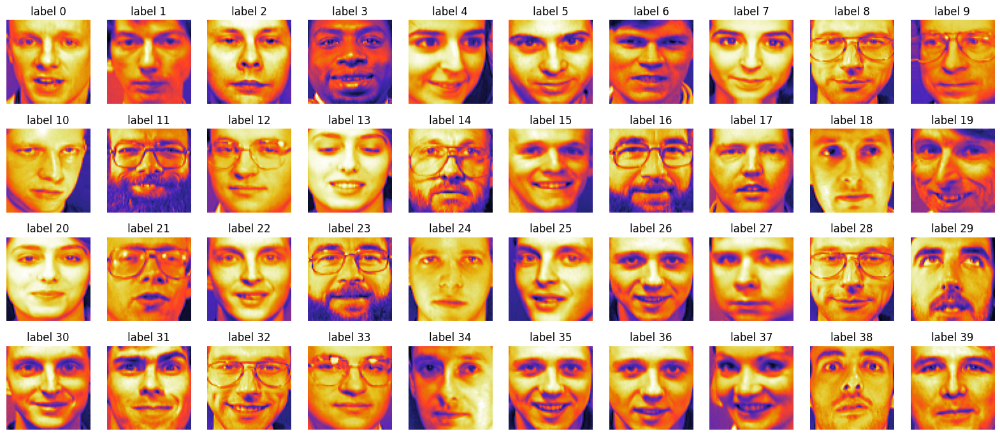

In [100]:
# Step-16 : High Contrast Visualization of Features Matrix from X_Test
plt.figure(figsize=(20,8.5))
for i in range(40):
    plt.subplot(4, 10, i+1)
    plt.imshow(X_test[i][0])
    plt.title(f"label {y[i*10]}")
    plt.set_cmap('CMRmap')
    plt.axis('off')

In [101]:
# Step-17 : Running on the Trained Model
W, H = model(X_test)
output_test = torch.matmul(model.H, model.W).reshape(-1, 1, 64, 64)

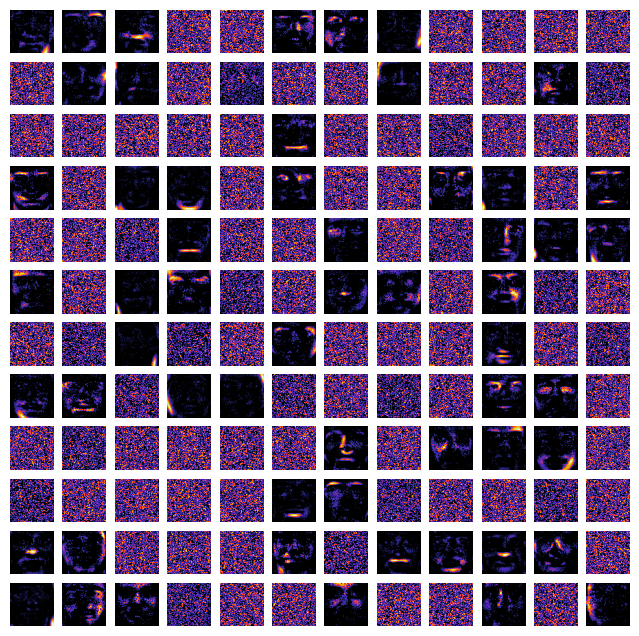

In [102]:
# Step-18 :  # Step-14 : Plotting the Basis Matrix 'W'
fig, ax = plt.subplots(12, 12, figsize=(8,8))
for i, axi in enumerate(ax.flat):
    axi.imshow(model.W.detach().numpy()[i].reshape(64, 64), cmap='CMRmap')
    axi.axis('off')

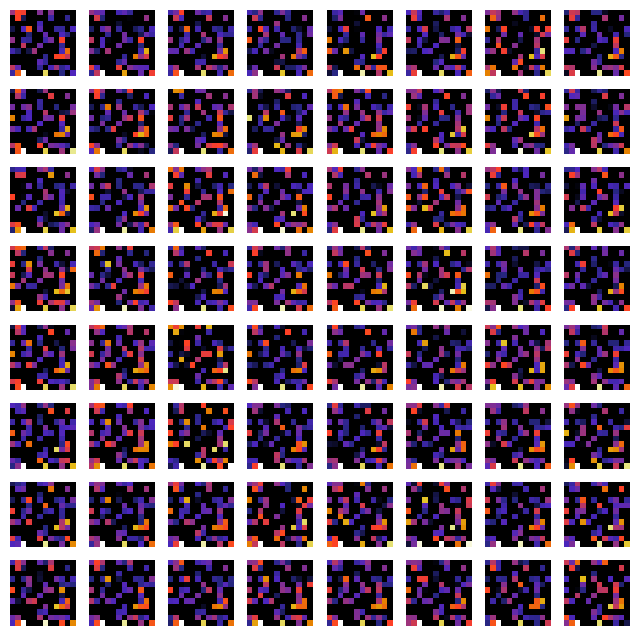

In [103]:
# Step-19 : Plotting the Coefficients Matrix 'H'
fig, ax = plt.subplots(8, 8, figsize=(8,8))
for i, axi in enumerate(ax.flat):
    axi.imshow(model.H.detach().numpy()[i].reshape(12, 12), cmap='CMRmap')
    axi.axis('off')

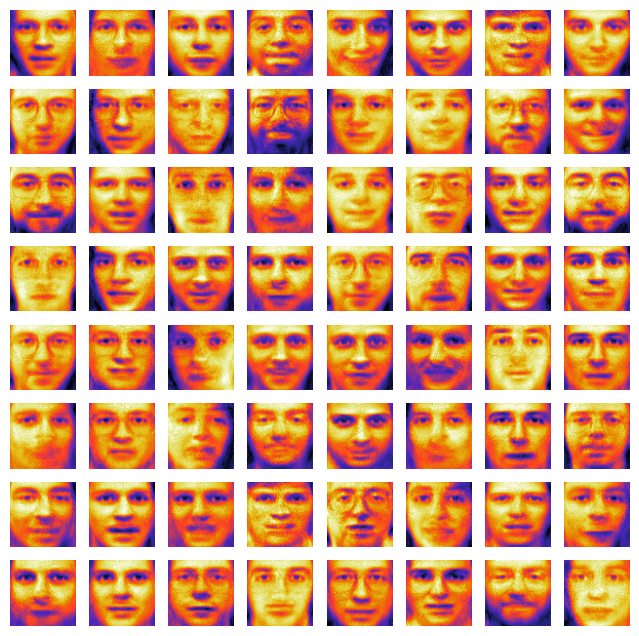

In [104]:
# Step-20 : Reconstructing the Matrix X from W and H of the Test Set!
fig, ax = plt.subplots(8, 8, figsize=(8,8))
for i, axi in enumerate(ax.flat):
    axi.imshow(output_test.detach().numpy()[i].reshape(64, 64), cmap='CMRmap')
    axi.axis('off')

## Displaying the Faces from Test Set along with their Deep-NMF Reconstructions!

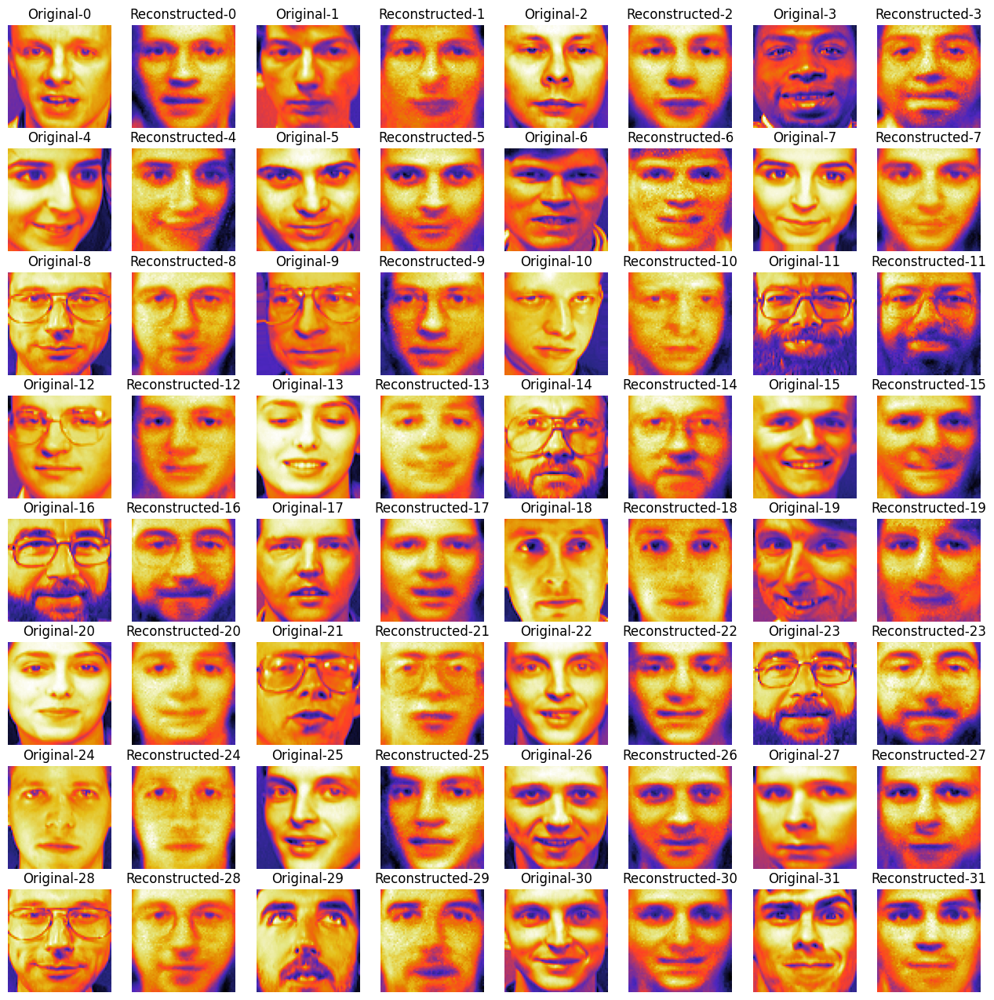

In [107]:
# Final Result!
fig, ax = plt.subplots(8, 8, figsize=(16,16))
for i, axi in enumerate(ax.flat):
    if i%2 == 0:
        axi.imshow(X_test[i//2][0], cmap='CMRmap')
        axi.set_title(f"Original-{i // 2}")
    else:
        axi.imshow(output_test.detach().numpy()[i//2].reshape(64, 64), cmap='CMRmap')
        axi.set_title(f"Reconstructed-{i // 2}")
    axi.axis('off')

## Observations!
---

### Hence, we have recognized that :-

1.   The Olivetti Faces dataset consists of grayscale facial images, which are inherently non-negative.

2.   NMF is specifically designed to work with non-negative data, making it well-suited for tasks like image factorization.

3. Neural networks, on the other hand, can be more flexible but may require careful architecture and preprocessing to handle non-negative data effectively.




## References
---

1. [The Why and How of Nonnegative Matrix Factorization](https://arxiv.org/pdf/1401.5226.pdf)
1. [A Deep Non-Negative Matrix Factorization Neural Network](https://www1.cmc.edu/pages/faculty/BHunter/papers/deep-negative-matrix.pdf)
1. [NON-NEGATIVE MATRIX FACTORIZATION AND CLASSIFIERS: EXPERIMENTAL STUDY](https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.103.4341&rep=rep1&type=pdf)

## THE END
---